# 02 DurationMatching : 03 OtherCF : ALL

---
## 0. Setup

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('seaborn-colorblind')
plt.style.use('seaborn-whitegrid')

import seaborn as sns

import sys
sys.path.append('../../RLPack')

import importlib
import itertools

---
## 1. Environment

In [2]:
import Env_DM
importlib.reload(Env_DM)

yield_curve = np.arange(11).reshape(-1, 1)/100 * np.ones(10).reshape(1, -1)
liability_CF = np.zeros(10)
liability_CF[-1] += -10

env = Env_DM.Environment(yield_curve, liability_CF)

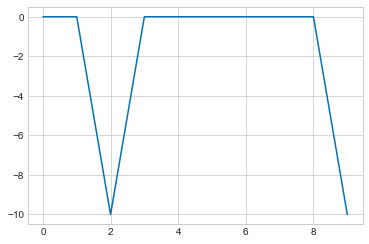

In [3]:
#liability_CF = np.array([-5, 0, 5, 5, 3, 0, -10, -15, -10, -5])
liability_CF = np.array([0, 0, -10, 0, 0, 0, 0, 0, 0, -10])

yield_vol = 0.0

plt.plot(liability_CF)
plt.show()

---
## 2. Other CF

In [4]:
env = Env_DM.Environment(yield_curve, liability_CF)

n_trials = 5
n_steps = 10000

df = pd.DataFrame()

Using TensorFlow backend.


Instructions for updating:
Colocations handled automatically by placer.
lr=0.001, eps=0.1, boltzmann=False
start testing... :  2019-10-30 00:10:57.303545
start trial 1/5 trial...


  5%|▌         | 507/10000 [00:02<00:46, 206.01it/s]

Instructions for updating:
Use tf.cast instead.


100%|██████████| 10000/10000 [06:07<00:00, 27.19it/s]


start trial 2/5 trial...


100%|██████████| 10000/10000 [06:19<00:00, 26.38it/s]


start trial 3/5 trial...


100%|██████████| 10000/10000 [05:47<00:00, 28.76it/s]


start trial 4/5 trial...


100%|██████████| 10000/10000 [05:47<00:00, 28.81it/s]


start trial 5/5 trial...


100%|██████████| 10000/10000 [05:53<00:00, 28.28it/s]


end testing... :  2019-10-30 00:40:58.132269
loss and reward history


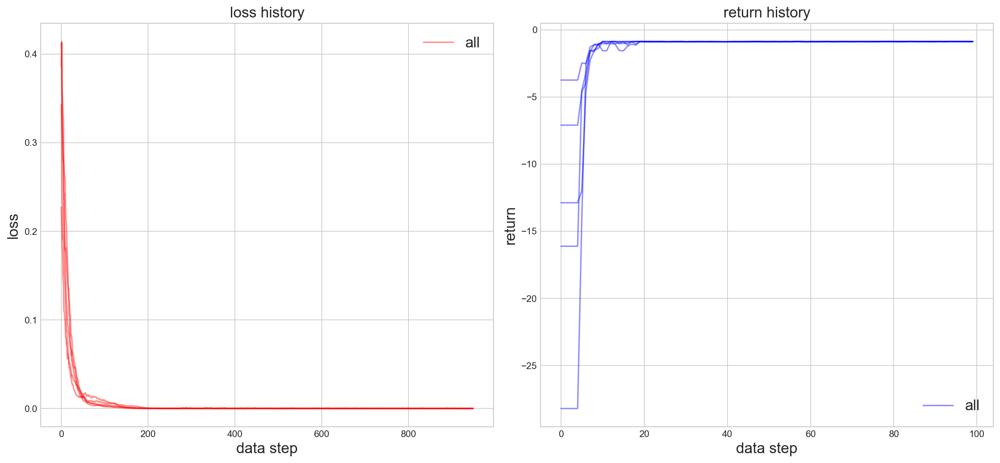

acquired action
action =  [5 5 5 5 5 5 5 5 5 5]
action =  [4 4 4 4 4 4 4 4 4 4]
action =  [3 3 3 3 3 3 3 3 3 3]
action =  [3 3 3 3 3 3 3 3 3 3]
action =  [3 3 3 3 3 3 3 3 3 3]
action =  [3 3 3 3 3 3 3 3 3 3]
action =  [2 2 2 2 2 2 2 2 2 2]
action =  [2 2 2 2 2 2 2 2 2 2]
action =  [1 1 1 1 1 1 1 1 1 1]
action =  [0 0 0 0 0 0 0 0 0 0]
return [-0.873 -0.873 -0.873 -0.873 -0.873 -0.873 -0.873 -0.873 -0.873 -0.873]
param distribution in model


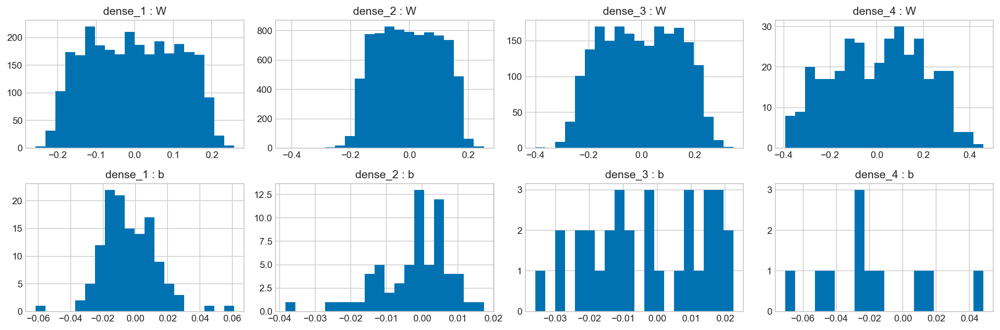

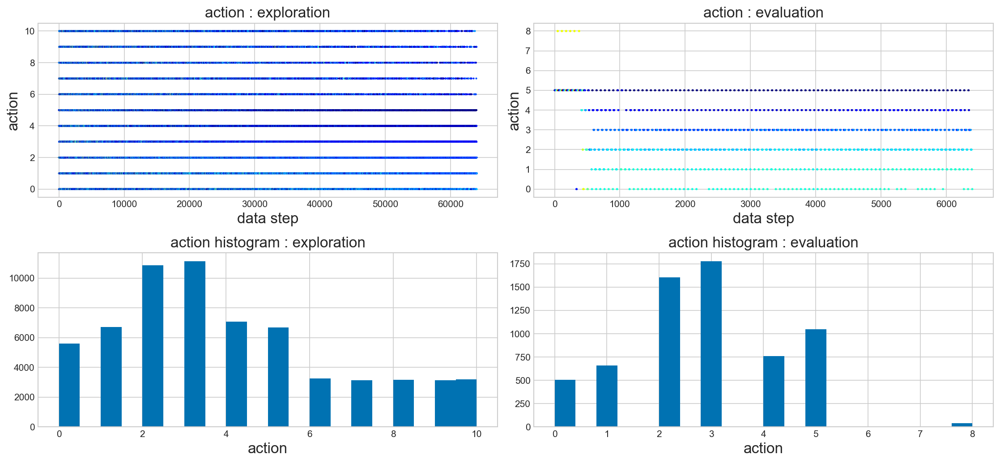

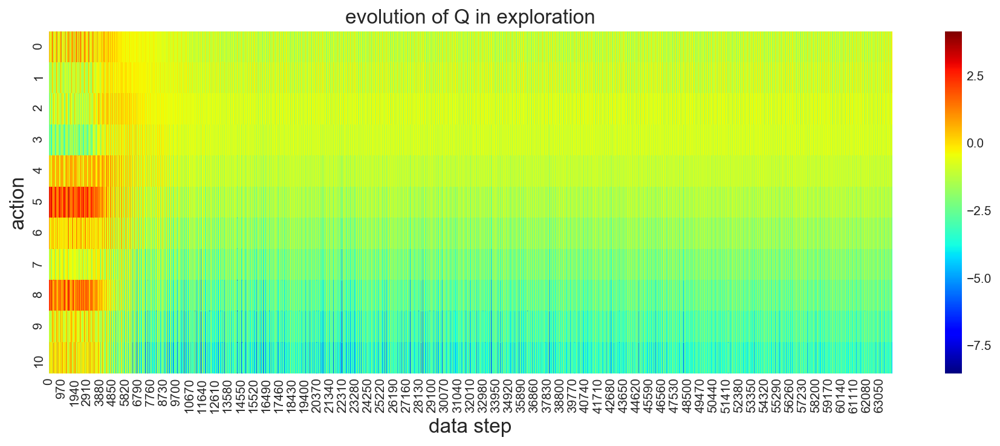

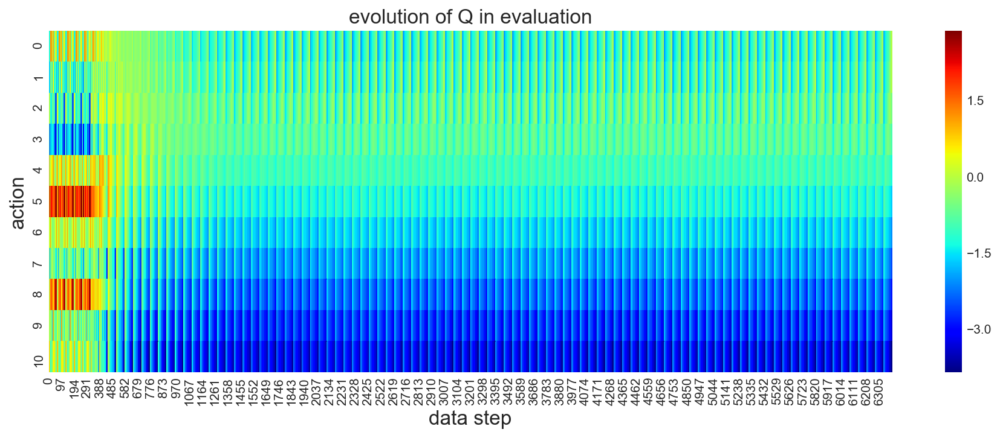

In [5]:
import DQN
import importlib
importlib.reload(DQN)  # original DRL code
from keras import optimizers

model = DQN.gen_model(input_shapes=env.shapes(), n_outputs=11, \
                           hidden_dims=[128, 64, 32], reg_l1=0.0, reg_l2=0.0, 
                           duel=False, duel_value_dim=8, duel_advantage_dim=16, 
                           input_reg=False, input_min=0, input_max=1,
                           output_reg=False, output_min=0, output_max=1)

#df = pd.DataFrame()
for lr, eps, boltzmann in itertools.product([1e-3,], [1e-1,], [False,]):
    print('======================================================')
    print('lr={}, eps={}, boltzmann={}'
          .format(lr, eps, boltzmann))
    
    tester = DQN.Tester(env, model)
    #n_trials = 5
    #n_steps = 10000
    tester.test(n_trials=n_trials, n_steps=n_steps,
                training_interval=10, n_batches=10, batch_size=256, alpha=1.0, 
                target_update_interval=20, doubleQ=False,
                gamma=1.0, optimizer=optimizers.Adam(lr),
                epsilon_start=1.0, epsilon_end=eps, epsilon_interval=n_steps,
                boltzmann=boltzmann, 
                verbose=False, verbose_interval=100, evaluate_interval=100, 
                get_log=True)

    viz = DQN.Visualizer()
    viz.viz_action_history(tester.trainer, lambda x:x[0], 
                           cmap='jet', alpha=1.0, s=1.0)
    viz.viz_Q_history(tester.trainer)
    
    for trial in range(n_trials):
        df_temp = pd.DataFrame(np.ravel(tester.return_histories[trial]['all']), columns=['return'])
        df_temp['trial'] = trial
        df_temp['t'] = np.arange(len(df_temp))
        #df_temp['lr'] = lr
        #df_temp['eps'] = eps
        #df_temp['boltzmann'] = boltzmann
        df_temp['Agent'] = 'DQN'

        df = pd.concat([df, df_temp])

    #ModelInspection.inspect_hidden_layers(tester.env, tester.model, tester.agent, show_hidden_hist=True)

df.to_csv(tester.name + '.csv')

lr=0.001, n_advantages=4, mult_critic=0.1, mult_entropy=0.1
start testing... :  2019-10-30 00:41:13.976083
start 0/5 th trial...


100%|██████████| 10000/10000 [03:12<00:00, 51.99it/s]


start 1/5 th trial...


100%|██████████| 10000/10000 [03:14<00:00, 51.51it/s]


start 2/5 th trial...


100%|██████████| 10000/10000 [03:20<00:00, 50.00it/s]


start 3/5 th trial...


100%|██████████| 10000/10000 [03:34<00:00, 46.54it/s]


start 4/5 th trial...


100%|██████████| 10000/10000 [03:21<00:00, 49.74it/s]


end testing... :  2019-10-30 00:58:03.187925
loss and reward history


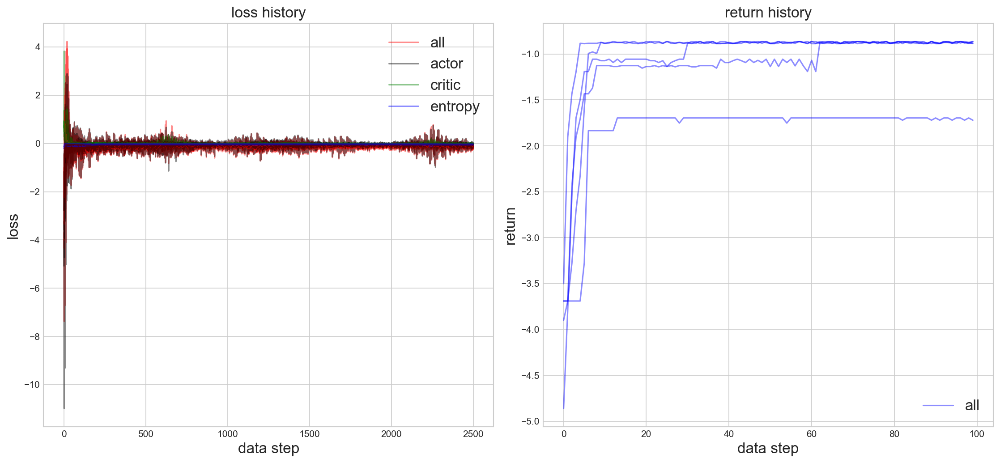

acquired action
action =  [5 5 5 5 5 5 5 5 5 5]
action =  [4 4 4 4 4 4 4 4 4 4]
action =  [4 4 4 4 4 4 4 4 4 4]
action =  [3 3 3 3 3 3 3 3 3 3]
action =  [3 3 3 3 3 3 3 3 3 3]
action =  [3 3 3 3 3 3 3 3 3 3]
action =  [3 3 3 3 3 3 3 3 3 3]
action =  [0 0 0 0 0 0 0 0 0 0]
action =  [0 0 0 0 0 0 0 0 0 0]
action =  [0 0 0 0 0 0 0 0 0 0]
return [-1.721 -1.721 -1.721 -1.721 -1.721 -1.721 -1.721 -1.721 -1.721 -1.721]
param distribution in model


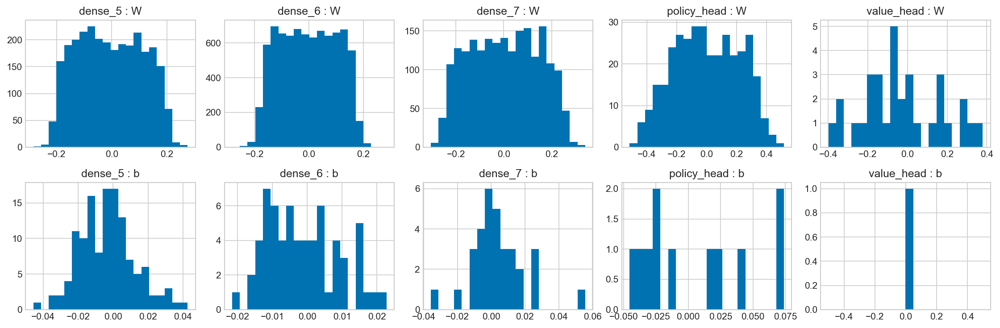

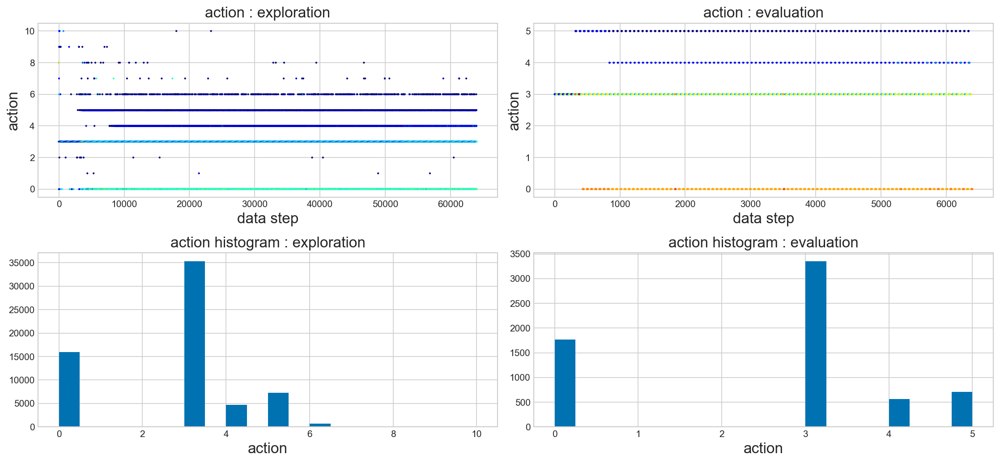

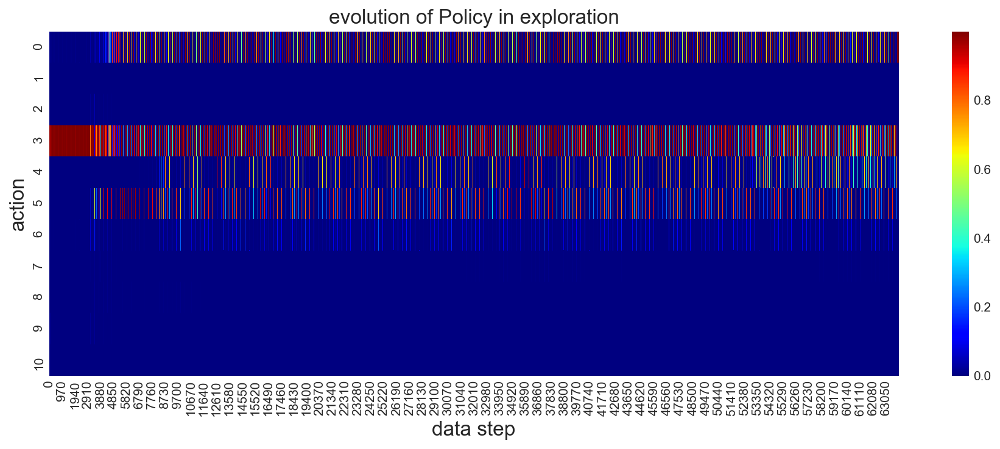

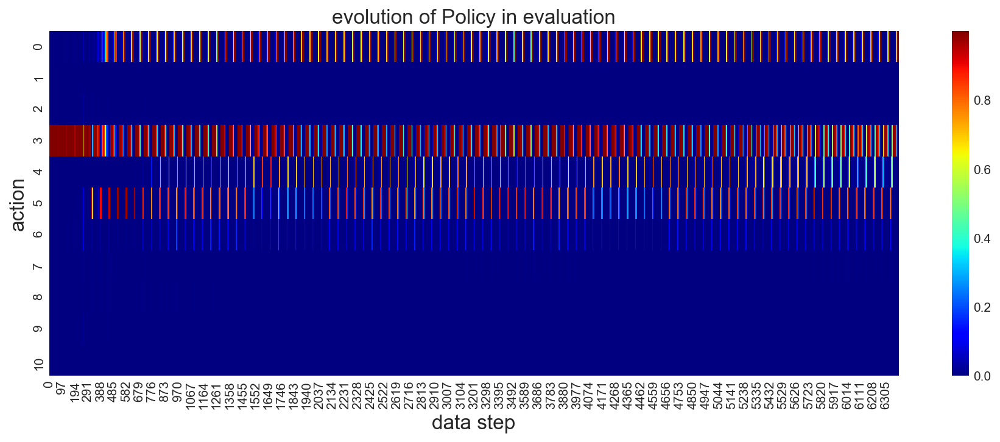

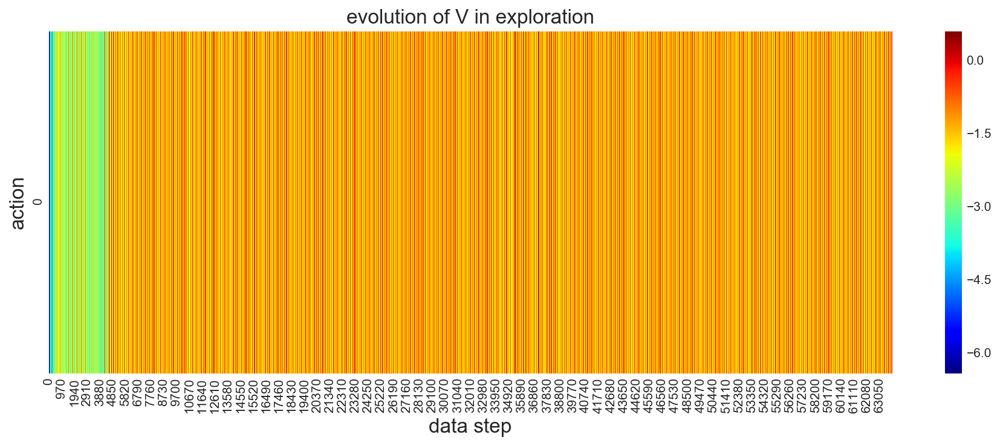

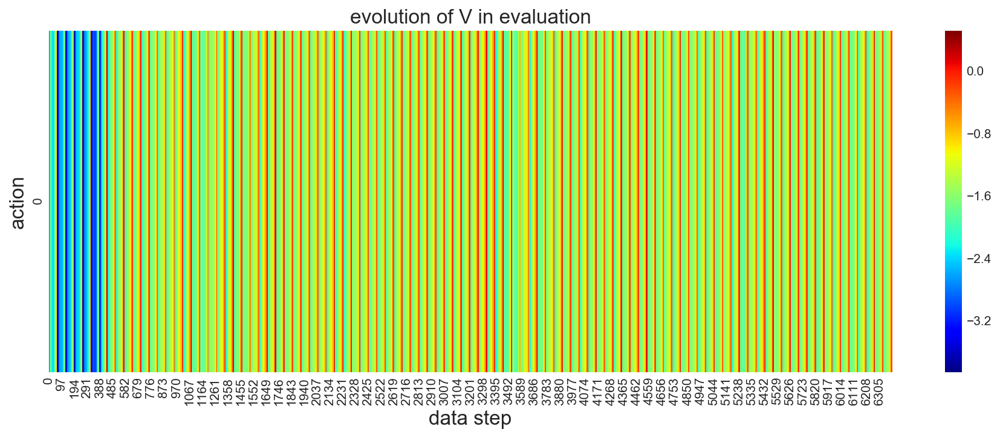

In [6]:
import A2C  # original DRL code
importlib.reload(A2C)  # original DRL code
from keras import optimizers

model = A2C.gen_model(input_shapes=env.shapes(), n_outputs=11, 
                      hidden_dims=[128, 64, 32])

#df = pd.DataFrame()
for lr, n_advantages, mult_critic, mult_entropy in itertools.product(
    [1e-3,], [4,], [0.1,], [0.1,]):
    print('======================================================')
    print('lr={}, n_advantages={}, mult_critic={}, mult_entropy={}'
          .format(lr, n_advantages, mult_critic, mult_entropy))
    
    tester = A2C.Tester(env, model)
    #n_trials = 5
    #n_steps = 10000
    tester.test(n_trials=n_trials, n_steps=n_steps, n_advantages=n_advantages,
               gamma=1.0, optimizer=optimizers.Adam(lr=lr),
               mult_actor=1.0, mult_critic=mult_critic, mult_entropy=mult_entropy,
               verbose=False, verbose_interval=100, evaluate_interval=100, 
               get_log=True)

    viz = A2C.Visualizer()
    viz.viz_action_history(tester.trainer, lambda x:x[0], 
                           cmap='jet', alpha=1.0, s=1.0)
    viz.viz_P_history(tester.trainer)
    viz.viz_V_history(tester.trainer)

    for trial in range(n_trials):
        df_temp = pd.DataFrame(np.ravel(tester.return_histories[trial]['all']), columns=['return'])
        df_temp['trial'] = trial
        df_temp['t'] = np.arange(len(df_temp))
        #df_temp['lr'] = lr
        #f_temp['n_advantages'] = n_advantages
        #df_temp['mult_critic'] = mult_critic
        #df_temp['mult_entropy'] = mult_entropy
        df_temp['Agent'] = 'A2C_discrete'

        df = pd.concat([df, df_temp])

    #ModelInspection.inspect_hidden_layers(tester.env, tester.model, tester.agent, show_hidden_hist=True)

df.to_csv(tester.name + '.csv')

In [7]:
mu_min = 0.0
mu_max = 10.0

lr=0.001, n_advantages=10, mult_critic=0.1, mult_entropy=0.01
start testing... :  2019-10-30 00:58:27.980580
start 0/5 th trial...


100%|██████████| 10000/10000 [02:09<00:00, 77.35it/s]


start 1/5 th trial...


100%|██████████| 10000/10000 [02:12<00:00, 75.22it/s]


start 2/5 th trial...


100%|██████████| 10000/10000 [02:16<00:00, 73.27it/s]


start 3/5 th trial...


100%|██████████| 10000/10000 [02:18<00:00, 72.19it/s]


start 4/5 th trial...


100%|██████████| 10000/10000 [02:21<00:00, 70.81it/s]


end testing... :  2019-10-30 01:09:56.023888
loss and reward history


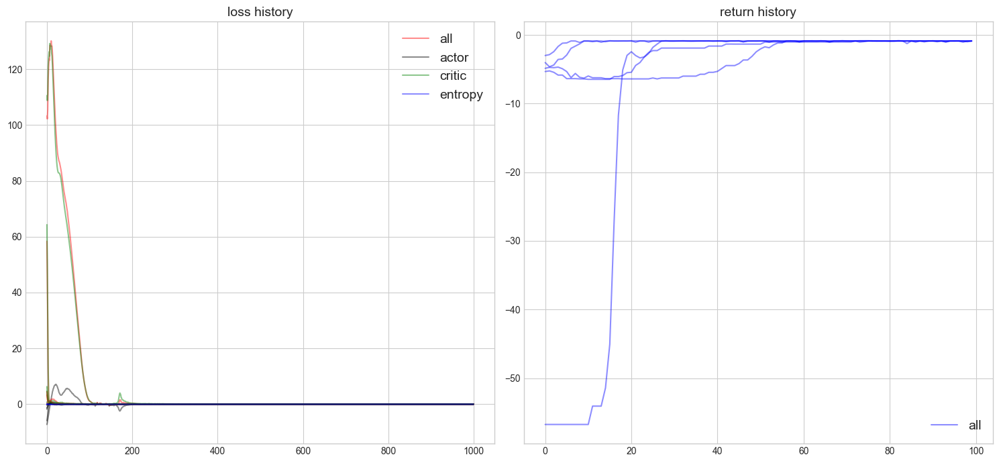

acquired action
action =  [5.123 5.123 5.123 5.123 5.123 5.123 5.123 5.123 5.123 5.123]
action =  [4.16 4.16 4.16 4.16 4.16 4.16 4.16 4.16 4.16 4.16]
action =  [3.743 3.743 3.743 3.743 3.743 3.743 3.743 3.743 3.743 3.743]
action =  [2.975 2.975 2.975 2.975 2.975 2.975 2.975 2.975 2.975 2.975]
action =  [2.86 2.86 2.86 2.86 2.86 2.86 2.86 2.86 2.86 2.86]
action =  [2.541 2.541 2.541 2.541 2.541 2.541 2.541 2.541 2.541 2.541]
action =  [2.06 2.06 2.06 2.06 2.06 2.06 2.06 2.06 2.06 2.06]
action =  [1.776 1.776 1.776 1.776 1.776 1.776 1.776 1.776 1.776 1.776]
action =  [0.966 0.966 0.966 0.966 0.966 0.966 0.966 0.966 0.966 0.966]
action =  [0.213 0.213 0.213 0.213 0.213 0.213 0.213 0.213 0.213 0.213]
return [-0.876 -0.876 -0.876 -0.876 -0.876 -0.876 -0.876 -0.876 -0.876 -0.876]
param distribution in model


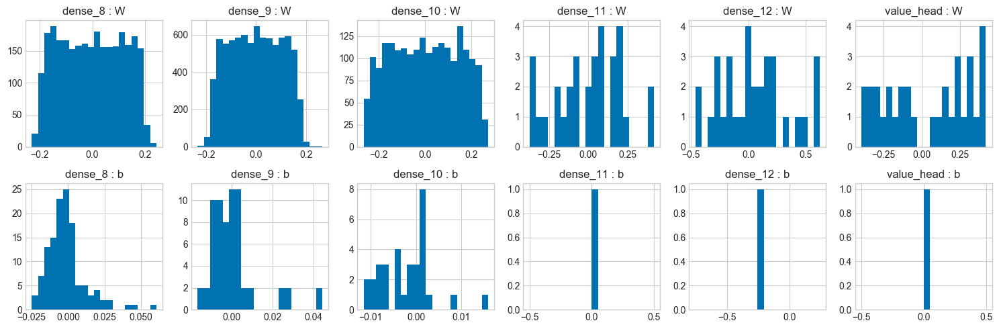

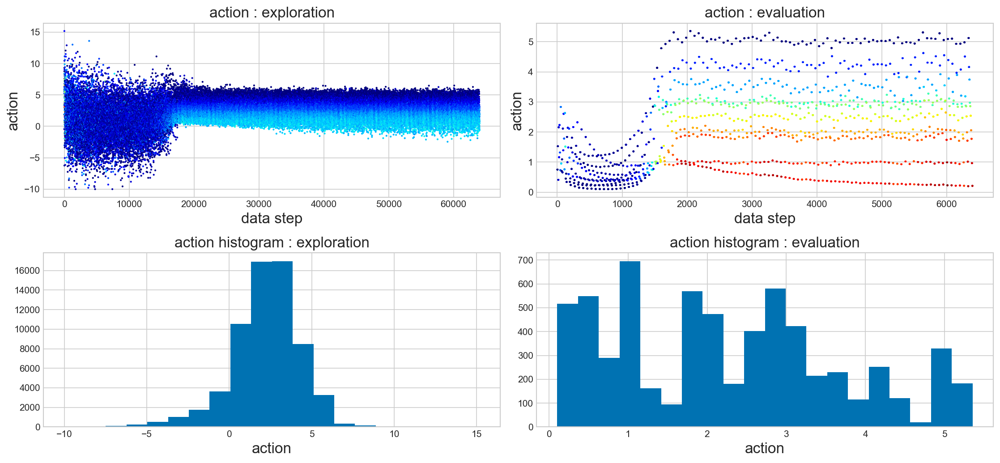

In [8]:
import importlib
import A2C_continuous
importlib.reload(A2C_continuous)  # original DRL code

from keras import optimizers

mu_min = mu_min
mu_max = mu_max
sigma_max = (mu_max - mu_min) / 3

model = A2C_continuous.gen_model(input_shapes=env.shapes(), n_outputs=1, \
                                 hidden_dims=[128, 64, 32], reg_l1=0.0, reg_l2=0.0, \
                                mu_min=mu_min, mu_max=mu_max, 
                                va_min=(0.001)**2, va_max=sigma_max**2, 
                                input_reg=False, input_min=0, input_max=1)

#df = pd.DataFrame()
for lr, n_advantages, mult_critic, mult_entropy in itertools.product(
    [1e-3,], [10,], [0.1,], [0.01,]):
    print('======================================================')
    print('lr={}, n_advantages={}, mult_critic={}, mult_entropy={}'
          .format(lr, n_advantages, mult_critic, mult_entropy))
    
    tester = A2C_continuous.Tester(env, model, val_min=mu_min-3*sigma_max, val_max=mu_max+3*sigma_max)
    #n_trials = 5
    #n_steps = 10000
    tester.test(n_trials=n_trials, n_steps=n_steps, n_advantages=n_advantages,
               gamma=1.0, optimizer=optimizers.Adam(lr=lr),
               mult_actor=0.1, mult_critic=mult_critic, mult_entropy=mult_entropy,
               verbose=False, verbose_interval=100, evaluate_interval=100, 
               get_log=True)

    viz = A2C_continuous.Visualizer()
    viz.viz_action_history(tester.trainer, state_valuation=lambda x:x[0], action_valuation=lambda x:x, 
                           cmap='jet', alpha=1.0, s=1.0)

    for trial in range(n_trials):
        df_temp = pd.DataFrame(np.ravel(tester.return_histories[trial]['all']), columns=['return'])
        df_temp['trial'] = trial
        df_temp['t'] = np.arange(len(df_temp))
        #df_temp['lr'] = lr
        #df_temp['n_advantages'] = n_advantages
        #df_temp['mult_critic'] = mult_critic
        #df_temp['mult_entropy'] = mult_entropy
        df_temp['Agent'] = 'A2C_continuous'

        df = pd.concat([df, df_temp])

    #ModelInspection.inspect_hidden_layers(tester.env, tester.model, tester.agent, show_hidden_hist=True)

df.to_csv(tester.name + '.csv')

lr_p=0.0001, lr_v=0.001, boltzmann=False, sigma_end=1.0, tau_end=10
start testing... :  2019-10-30 01:10:08.151894
start 0/5 th trial...


100%|██████████| 10000/10000 [15:41<00:00, 10.62it/s]


start 1/5 th trial...


100%|██████████| 10000/10000 [15:50<00:00, 10.52it/s]


start 2/5 th trial...


100%|██████████| 10000/10000 [16:07<00:00, 10.34it/s]


start 3/5 th trial...


100%|██████████| 10000/10000 [16:21<00:00, 10.19it/s]


start 4/5 th trial...


100%|██████████| 10000/10000 [17:05<00:00,  9.75it/s]


end testing... :  2019-10-30 02:31:55.070777
loss and reward history


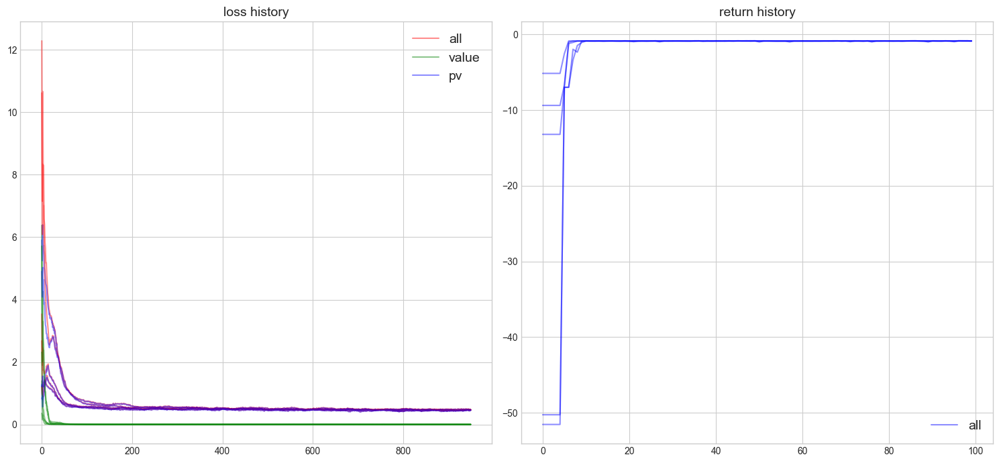

acquired action
action =  [5.031 5.031 5.031 5.031 5.031 5.031 5.031 5.031 5.031 5.031]
action =  [4.262 4.262 4.262 4.262 4.262 4.262 4.262 4.262 4.262 4.262]
action =  [3.592 3.592 3.592 3.592 3.592 3.592 3.592 3.592 3.592 3.592]
action =  [3.03 3.03 3.03 3.03 3.03 3.03 3.03 3.03 3.03 3.03]
action =  [2.842 2.842 2.842 2.842 2.842 2.842 2.842 2.842 2.842 2.842]
action =  [2.346 2.346 2.346 2.346 2.346 2.346 2.346 2.346 2.346 2.346]
action =  [1.976 1.976 1.976 1.976 1.976 1.976 1.976 1.976 1.976 1.976]
action =  [1.917 1.917 1.917 1.917 1.917 1.917 1.917 1.917 1.917 1.917]
action =  [1.023 1.023 1.023 1.023 1.023 1.023 1.023 1.023 1.023 1.023]
action =  [0.574 0.574 0.574 0.574 0.574 0.574 0.574 0.574 0.574 0.574]
return [-0.863 -0.863 -0.863 -0.863 -0.863 -0.863 -0.863 -0.863 -0.863 -0.863]
param distribution in model_policy


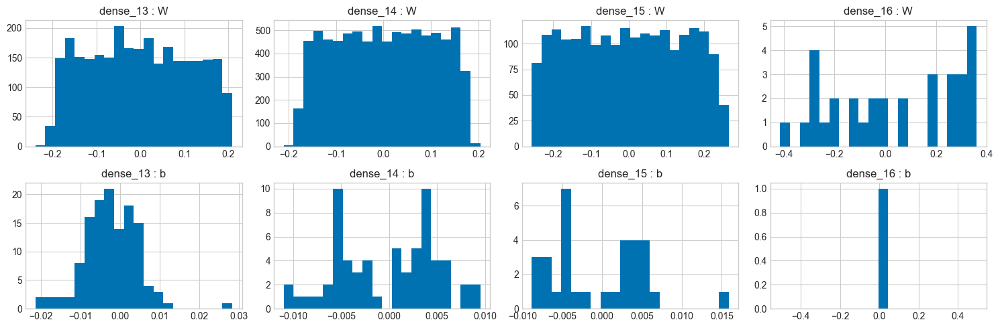

param distribution in model_value


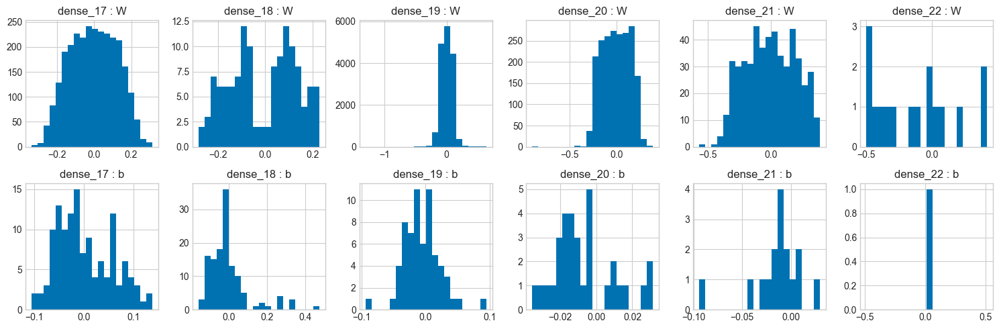

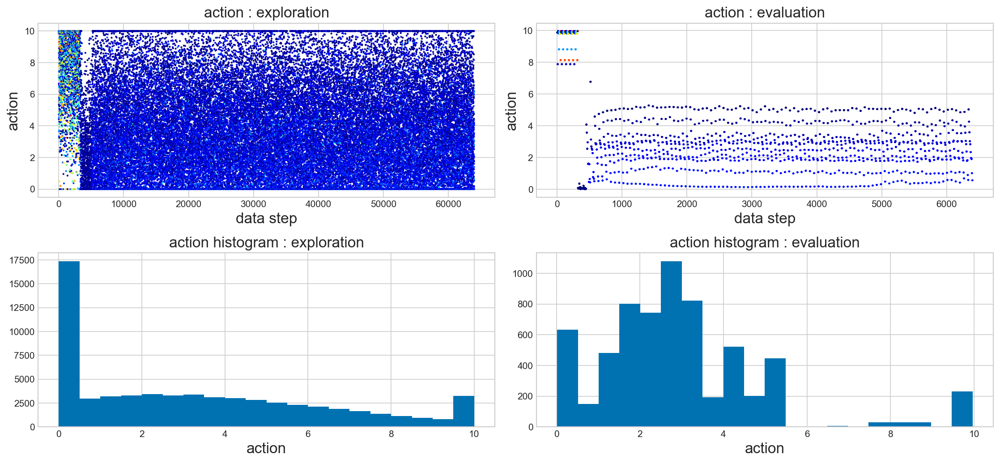

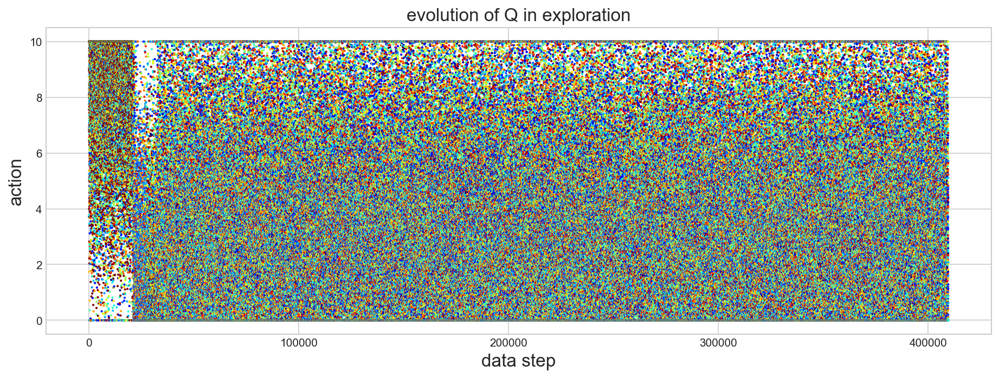

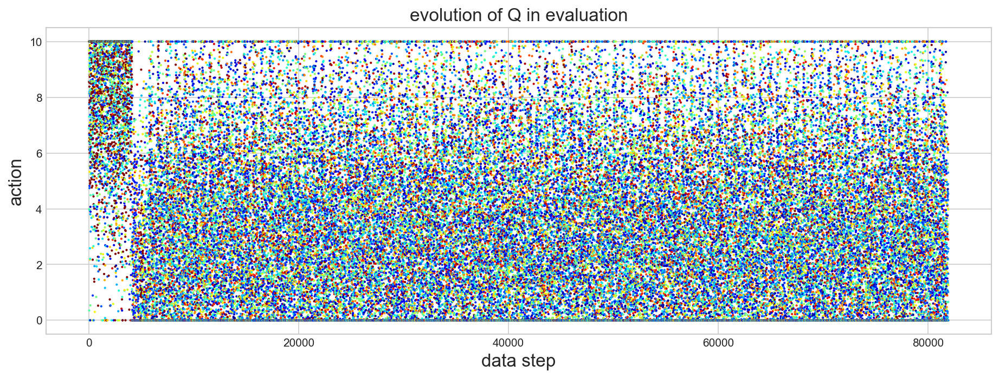

In [9]:
import DDPG  # original DRL code
importlib.reload(DDPG)
from keras import optimizers

action_min = mu_min
action_max = mu_max
sigma_max = (action_max - action_min) / 3

model_policy = DDPG.gen_model_policy(state_shapes=env.shapes(), n_actions=1, 
                                     hidden_dims=[128, 64, 32], 
                                     reg_l1=0.0, reg_l2=0.0, 
                                     action_min=action_min, action_max=action_max, 
                                     batch_norm_input=False, 
                                     state_reg=False, state_min=0, state_max=10)

model_value = DDPG.gen_model_value(state_shapes=env.shapes(), n_actions=1, \
                                   hidden_action_dims=[128,], 
                                   hidden_state_dims=[128,],
                                   hidden_dims=[64, 32, 16],
                                   reg_l1=0.0, reg_l2=0.0,
                                   batch_norm_state_hidden=False)


#df = pd.DataFrame()
for lr_p, lr_v, boltzmann, sigma_end, tau_end in itertools.product(
    [1e-4,], [1e-3,], [False,], [1.0,], [10,]):
    print('======================================================')
    print('lr_p={}, lr_v={}, boltzmann={}, sigma_end={}, tau_end={}'
          .format(lr_p, lr_v, boltzmann, sigma_end, tau_end))
    
    tester = DDPG.Tester(env, model_policy, model_value, val_min=action_min, val_max=action_max)
    #n_trials = 5
    #n_steps = 10000
    tester.test(n_trials=n_trials,
                gamma=1.0,
                n_steps=n_steps, training_interval=10, n_batches=10, batch_size=256,
                target_update_interval_policy=20, target_update_interval_value=20,
                tau_policy=0.5, tau_value=0.5,
                optimizer_pv=optimizers.Adam(lr=lr_p), optimizer_value=optimizers.Adam(lr=lr_v),
                sigma_start=sigma_max, sigma_end=sigma_max*sigma_end, sigma_interval=n_steps,
                boltzmann=boltzmann, tau_start=10, tau_end=tau_end, tau_interval=n_steps, n_samples=64,
                verbose=False, verbose_interval=100, evaluate_interval=100, 
                wampup_steps=500, 
                get_log=True)

    viz = DDPG.Visualizer()
    viz.viz_action_history(tester.trainer, state_valuation=lambda x:x[0], action_valuation=lambda x:x, 
                               cmap='jet', alpha=1.0, s=1.0)
    viz.viz_Q_history(trainer=tester.trainer, 
                      state_valuation=lambda x:np.ravel(x[0][:, 0]), 
                      action_valuation=lambda x:np.ravel(x[:, 0]),
                      data_span_exp=100, data_span_eva=100,)
    
    for trial in range(n_trials):
        df_temp = pd.DataFrame(np.ravel(tester.return_histories[trial]['all']), columns=['return'])
        df_temp['trial'] = trial
        df_temp['t'] = np.arange(len(df_temp))
        #df_temp['lr_p'] = lr_p
        #df_temp['lr_v'] = lr_v
        #df_temp['boltzmann'] = boltzmann
        #df_temp['sigma_end'] = sigma_end
        #df_temp['tau_end'] = tau_end
        df_temp['Agent'] = 'DDPG'

        df = pd.concat([df, df_temp])

    #ModelInspection.inspect_hidden_layers(tester.env, tester.model, tester.agent, show_hidden_hist=True)

df.to_csv(tester.name + '.csv')

lr=1e-05, sigma_end=0.5
start testing... :  2019-10-30 02:32:26.367966
start trial 0/5 trial...


100%|██████████| 10000/10000 [03:31<00:00, 47.19it/s]


start trial 1/5 trial...


100%|██████████| 10000/10000 [03:36<00:00, 46.17it/s]


start trial 2/5 trial...


100%|██████████| 10000/10000 [03:38<00:00, 45.80it/s]


start trial 3/5 trial...


100%|██████████| 10000/10000 [03:47<00:00, 44.04it/s]


start trial 4/5 trial...


100%|██████████| 10000/10000 [03:42<00:00, 44.98it/s]


end testing... :  2019-10-30 02:51:02.141071
loss and return history


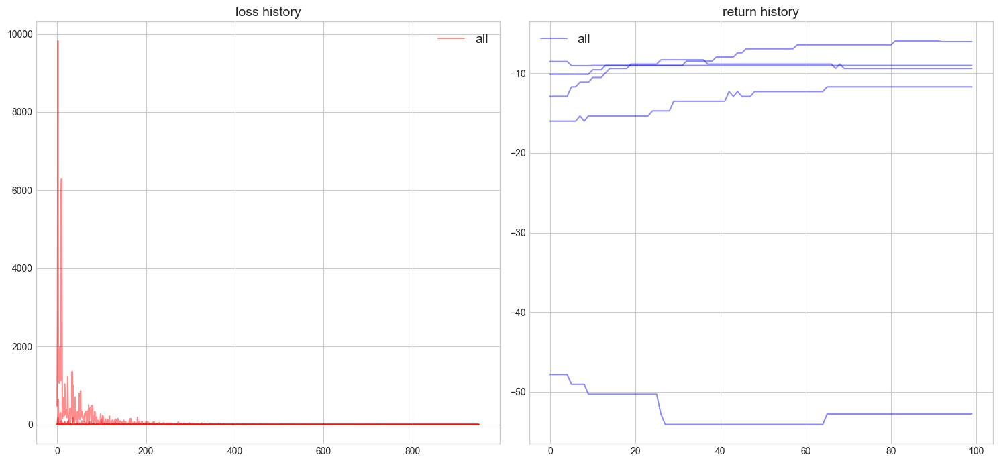

acquired action
action =  [5.083 5.083 5.083 5.083 5.083 5.083 5.083 5.083 5.083 5.083]
action =  [4.762 4.762 4.762 4.762 4.762 4.762 4.762 4.762 4.762 4.762]
action =  [4.941 4.941 4.941 4.941 4.941 4.941 4.941 4.941 4.941 4.941]
action =  [4.759 4.759 4.759 4.759 4.759 4.759 4.759 4.759 4.759 4.759]
action =  [5.082 5.082 5.082 5.082 5.082 5.082 5.082 5.082 5.082 5.082]
action =  [4.966 4.966 4.966 4.966 4.966 4.966 4.966 4.966 4.966 4.966]
action =  [6.032 6.032 6.032 6.032 6.032 6.032 6.032 6.032 6.032 6.032]
action =  [4.924 4.924 4.924 4.924 4.924 4.924 4.924 4.924 4.924 4.924]
action =  [4.683 4.683 4.683 4.683 4.683 4.683 4.683 4.683 4.683 4.683]
action =  [4.99 4.99 4.99 4.99 4.99 4.99 4.99 4.99 4.99 4.99]
return [-11.702 -11.702 -11.702 -11.702 -11.702 -11.702 -11.702 -11.702 -11.702
 -11.702]
param distribution in model


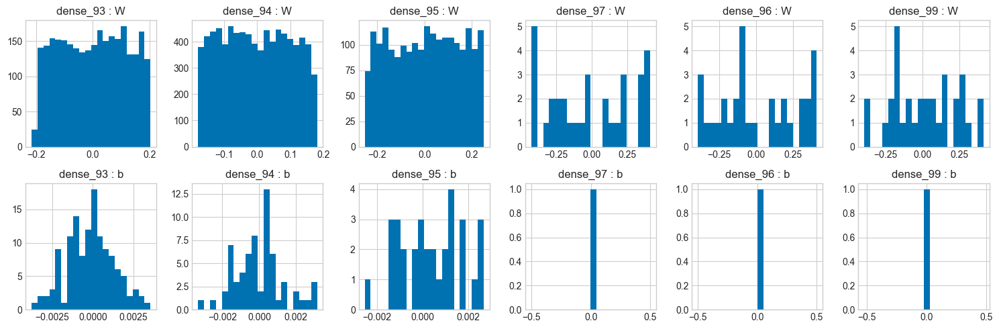

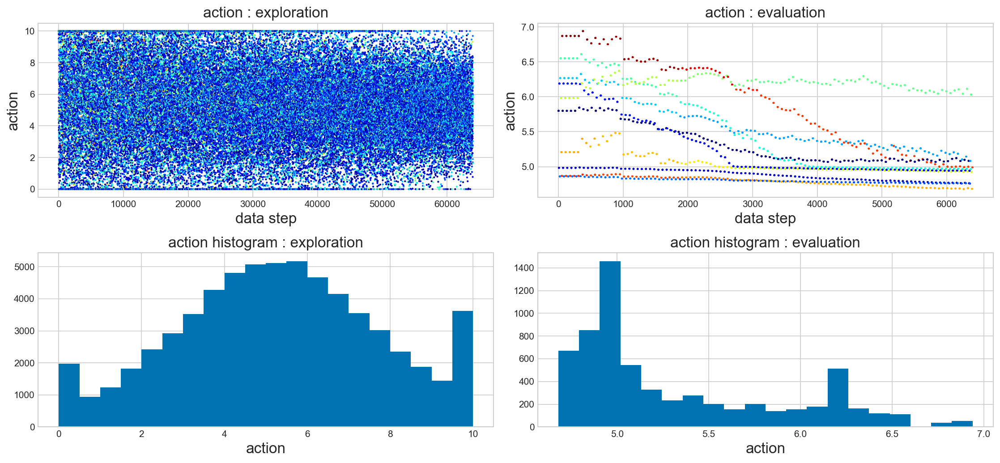

In [10]:
import NAF
importlib.reload(NAF)

from keras import optimizers
np.set_printoptions(precision=3)  # 数値桁数を指定．

action_min = mu_min
action_max = mu_max
sigma = (action_max - action_min) / 3

model_gen_func = lambda : NAF.gen_model(input_shapes=env.shapes(), n_actions=1, 
                     hidden_dims=[128, 64, 32], reg_l1=0.0, reg_l2=0.0, 
                     input_reg=False, input_min=0, input_max=10, 
                     action_reg=True, action_min=action_min, action_max=action_max,
                     value_reg=False, value_min=0, value_max=10)
model = model_gen_func()

#df = pd.DataFrame()
for lr, sigma_end in itertools.product(
    [1e-5,], [0.5,]):
    print('======================================================')
    print('lr={}, sigma_end={}'
          .format(lr, sigma_end))
    
    tester = NAF.Tester(env, model, val_min=action_min, val_max=action_max, 
                        model_gen_func=model_gen_func)
    #n_trials = 5
    #n_steps = 10000
    tester.test(n_trials=n_trials, 
                n_steps=n_steps, training_interval=10, n_batches=10, batch_size=128,
                alpha=1.0, target_update_interval=20,
                gamma=1.0,
                optimizer=optimizers.Adam(lr), 
                sigma_start=sigma, sigma_end=sigma * sigma_end, sigma_interval=n_steps,
                verbose=False, verbose_interval=100, evaluate_interval=100, 
                get_log=True)
    
    viz = NAF.Visualizer()
    viz.viz_action_history(tester.trainer, state_valuation=lambda x:x[0], action_valuation=lambda x:x, 
                           cmap='jet', alpha=1.0, s=1.0)
    
    for trial in range(n_trials):
        df_temp = pd.DataFrame(np.ravel(tester.return_histories[trial]['all']), columns=['return'])
        df_temp['trial'] = trial
        df_temp['t'] = np.arange(len(df_temp))
        #df_temp['lr'] = lr
        #df_temp['sigma_end'] = sigma_end
        df_temp['Agent'] = 'NAF'

        df = pd.concat([df, df_temp])

    #ModelInspection.inspect_hidden_layers(tester.env, tester.model, tester.agent, show_hidden_hist=True)

df.to_csv(tester.name + '.csv')

lr=0.001, mult_critic=1.0, mult_entropy=1e-05
start testing... :  2019-10-30 02:51:11.943506
start 0/5 th trial...


100%|██████████| 10000/10000 [05:24<00:00, 30.77it/s]


start 1/5 th trial...


100%|██████████| 10000/10000 [05:25<00:00, 30.72it/s]


start 2/5 th trial...


100%|██████████| 10000/10000 [05:28<00:00, 30.42it/s]


start 3/5 th trial...


100%|██████████| 10000/10000 [05:30<00:00, 30.30it/s]


start 4/5 th trial...


100%|██████████| 10000/10000 [05:31<00:00, 30.19it/s]


end testing... :  2019-10-30 03:18:54.953836
loss and reward history


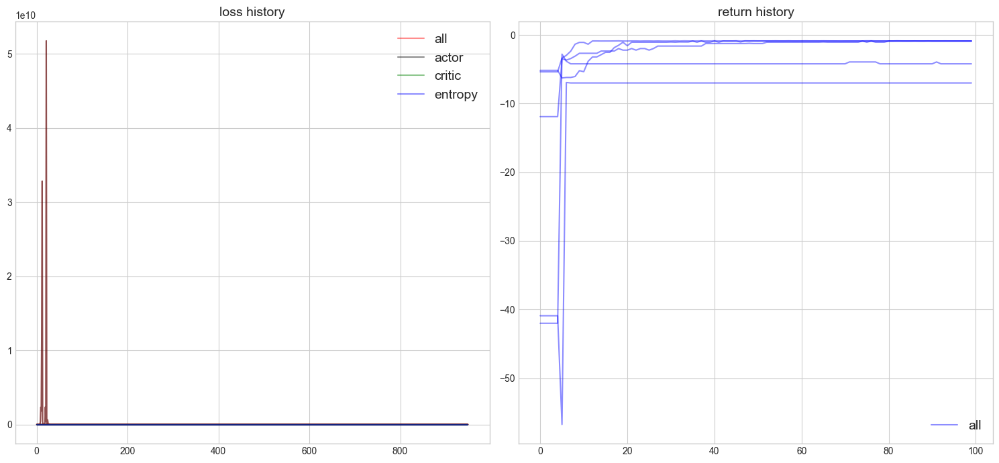

acquired action
action =  [2.049 2.049 2.049 2.049 2.049 2.049 2.049 2.049 2.049 2.049]
action =  [3.459 3.459 3.459 3.459 3.459 3.459 3.459 3.459 3.459 3.459]
action =  [2.771 2.771 2.771 2.771 2.771 2.771 2.771 2.771 2.771 2.771]
action =  [1.804 1.804 1.804 1.804 1.804 1.804 1.804 1.804 1.804 1.804]
action =  [1.617 1.617 1.617 1.617 1.617 1.617 1.617 1.617 1.617 1.617]
action =  [1.53 1.53 1.53 1.53 1.53 1.53 1.53 1.53 1.53 1.53]
action =  [0.673 0.673 0.673 0.673 0.673 0.673 0.673 0.673 0.673 0.673]
action =  [1.729 1.729 1.729 1.729 1.729 1.729 1.729 1.729 1.729 1.729]
action =  [1.81 1.81 1.81 1.81 1.81 1.81 1.81 1.81 1.81 1.81]
action =  [3.601 3.601 3.601 3.601 3.601 3.601 3.601 3.601 3.601 3.601]
return [-4.205 -4.205 -4.205 -4.205 -4.205 -4.205 -4.205 -4.205 -4.205 -4.205]
param distribution in model


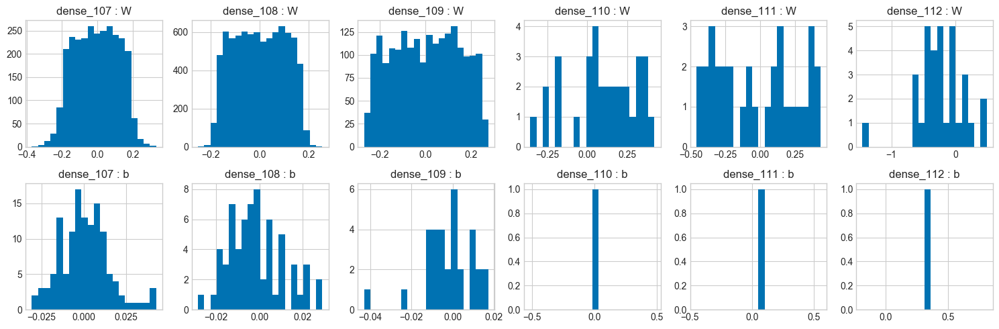

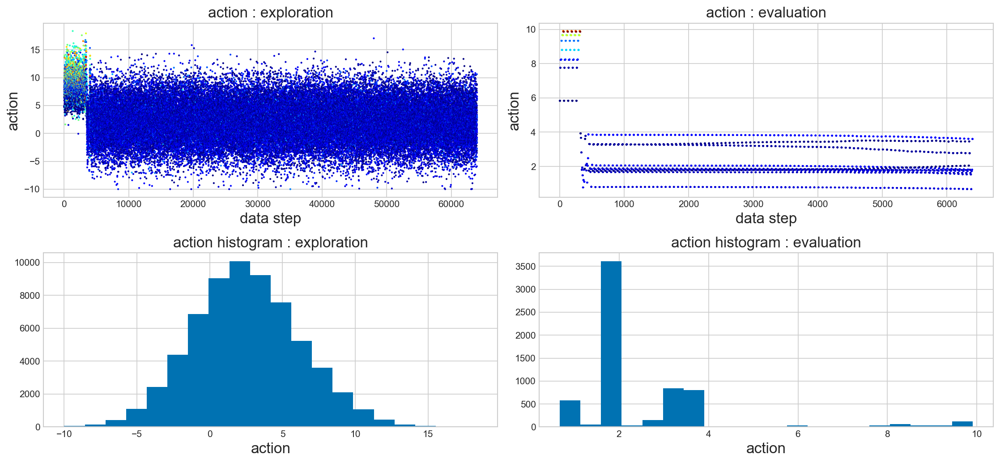

In [11]:
import AWR
importlib.reload(AWR)  # original DRL code

from keras import optimizers

mu_min = mu_min
mu_max = mu_max
sigma_max = (mu_max - mu_min) / 3

model = AWR.gen_model(input_shapes=env.shapes(), n_outputs=1, \
                      hidden_dims=[128, 64, 32], reg_l1=0.0, reg_l2=0.0, \
                      state_reg=False, state_min=-1.0, state_max=1.0,
                      action_reg=True, 
                      action_min=mu_min, action_max=mu_max, 
                      action_sigma_min=0.0001, action_sigma_max=sigma_max, 
                      value_reg=False, value_min=0, value_max=1)

#df = pd.DataFrame()
for lr, mult_critic, mult_entropy in itertools.product(
    [1e-3,], [1.0,], [1e-5,]):
    print('======================================================')
    print('lr={}, mult_critic={}, mult_entropy={}'
          .format(lr, mult_critic, mult_entropy))
    
    tester = AWR.Tester(env, model, 
                        action_min=mu_min-3*sigma_max, 
                        action_max=mu_max+3*sigma_max)
    #n_trials = 1
    #n_steps = 10000
    tester.test(n_trials=n_trials, n_steps=n_steps, 
                training_interval=10, n_batches=10, batch_size=256,
                buf_alpha=0.5, buf_beta=0.5, buf_mode='rank',
                gamma=1.0, 
                optimizer=optimizers.Adam(lr=lr),
                mult_actor=1.0, mult_critic=mult_critic, mult_entropy=mult_entropy, mult_beta=1.0, 
                verbose=False, verbose_interval=100, evaluate_interval=100, 
                get_log=True)

    viz = AWR.Visualizer()
    viz.viz_action_history(tester.trainer, state_valuation=lambda x:x[0], action_valuation=lambda x:x, 
                           cmap='jet', alpha=1.0, s=1.0)

    for trial in range(n_trials):
        df_temp = pd.DataFrame(np.ravel(tester.return_histories[trial]['all']), columns=['return'])
        df_temp['trial'] = trial
        df_temp['t'] = np.arange(len(df_temp))
        #df_temp['lr'] = lr
        #df_temp['mult_critic'] = mult_critic
        #df_temp['mult_entropy'] = mult_entropy
        df_temp['Agent'] = 'AWR'

        df = pd.concat([df, df_temp])

    #ModelInspection.inspect_hidden_layers(tester.env, tester.model, tester.agent, show_hidden_hist=True)

df.to_csv(tester.name + '.csv')

In [12]:
env = Env_DM.Environment(yield_curve, liability_CF, n_agents=1)

  0%|          | 0/1000 [00:00<?, ?it/s]

lr=0.01, eps=0.01
start testing... :  2019-10-30 03:19:04.997117
start trial 0/5 trial...


  0%|          | 0/1000 [00:00<?, ?it/s]

start trial 1/5 trial...


  0%|          | 0/1000 [00:00<?, ?it/s]

start trial 2/5 trial...


  0%|          | 0/1000 [00:00<?, ?it/s]

start trial 3/5 trial...


  0%|          | 0/1000 [00:00<?, ?it/s]

start trial 4/5 trial...


100%|██████████| 1000/1000 [1:21:02<00:00,  4.86s/it]


end testing... :  2019-10-30 09:48:55.934077
loss and reward history


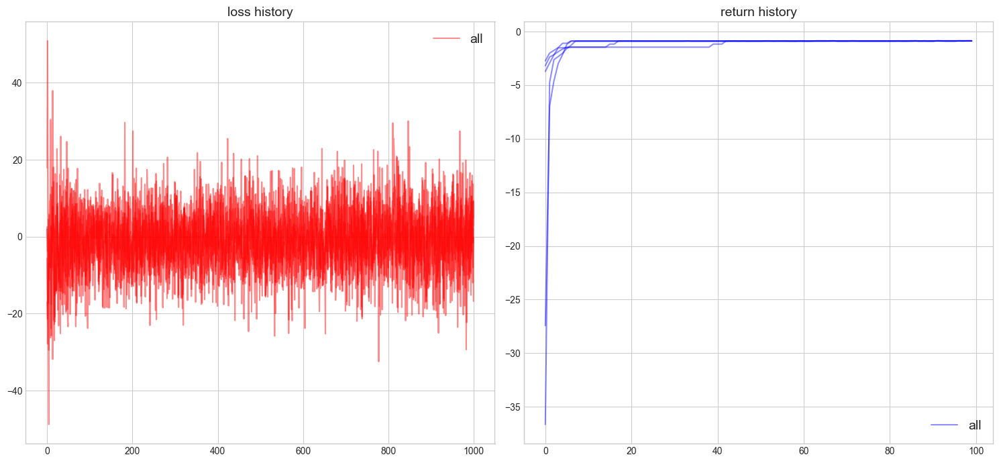

acquired action
action =  [5.105]
action =  [4.085]
action =  [3.54]
action =  [2.998]
action =  [2.972]
action =  [2.156]
action =  [1.946]
action =  [1.824]
action =  [0.953]
action =  [1.018]
total_reward [-0.863]
param distribution in model


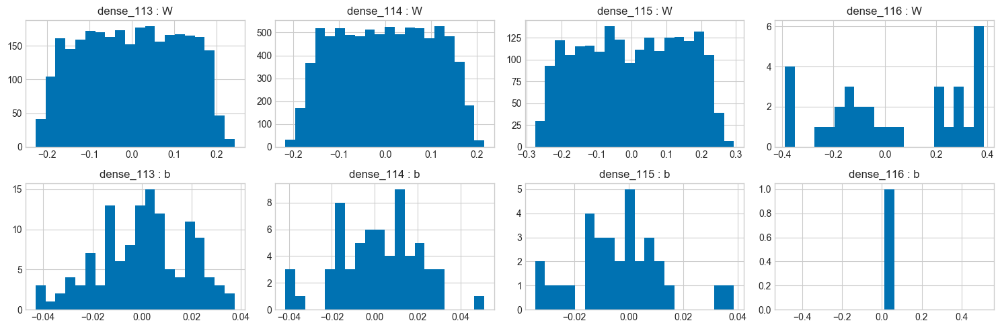

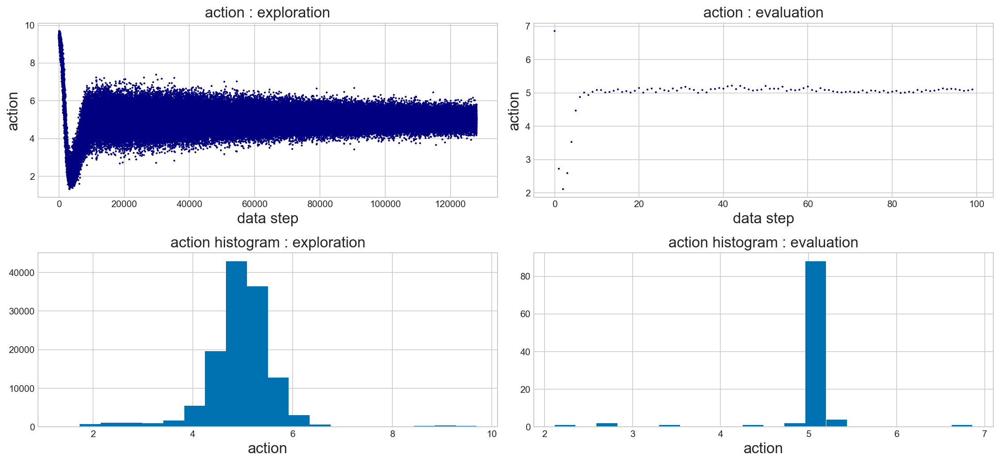

In [13]:
import ES
importlib.reload(ES)
from keras import optimizers

action_min = mu_min
action_max = mu_max

model = ES.gen_model(input_shapes=env.shapes(), n_outputs=1, \
                     hidden_dims=[128, 64, 32], reg_l1=0.0, reg_l2=0.0, \
                     action_min=action_min, action_max=action_max)

#df = pd.DataFrame()
for lr, eps in itertools.product([1e-2], [1e-2]):
    print('======================================================')
    print('lr={}, eps={}'
          .format(lr, eps))
    tester = ES.Tester(env, model, name='ES_01')
    #n_trials = 3
    #n_steps = 10000
    tester.test(n_trials=n_trials, n_episodes=n_steps // 10, n_samples=64,
                gamma=1.0,
                learning_rate_start=lr, learning_rate_end=lr, learning_rate_interval=100,
                epsilon_start=eps, epsilon_end=eps, epsilon_interval=100,
                verbose=False, verbose_interval=100//10, evaluate_interval=100//10, 
                get_log=True)
    
    viz = ES.Visualizer()
    viz.viz_action_history(tester.trainer, state_valuation=lambda x:x[0], action_valuation=lambda x:x,
                       data_span=10,
                       cmap='jet', alpha=1.0, s=1.0)
    
    for trial in range(n_trials):
        df_temp = pd.DataFrame(np.ravel(tester.return_histories[trial]['all']), columns=['return'])
        df_temp['trial'] = trial
        df_temp['t'] = np.arange(len(df_temp))
        #df_temp['lr'] = lr
        #df_temp['eps'] = eps
        df_temp['Agent'] = 'ES'

        df = pd.concat([df, df_temp])

    #ModelInspection.inspect_hidden_layers(tester.env, tester.model, tester.agent, show_hidden_hist=True)

df.to_csv(tester.name + '.csv')

er=0.5, eps=0.01
start testing... :  2019-10-30 09:49:06.450573
start trial 0/5 trial...


100%|██████████| 1000/1000 [1:26:09<00:00,  5.17s/it]


start trial 1/5 trial...


100%|██████████| 1000/1000 [1:24:20<00:00,  5.06s/it]


start trial 2/5 trial...


100%|██████████| 1000/1000 [1:23:41<00:00,  5.02s/it]


start trial 3/5 trial...


100%|██████████| 1000/1000 [1:24:31<00:00,  5.07s/it]


start trial 4/5 trial...


100%|██████████| 1000/1000 [1:24:15<00:00,  5.06s/it]


end testing... :  2019-10-30 16:53:59.633238
loss and reward history


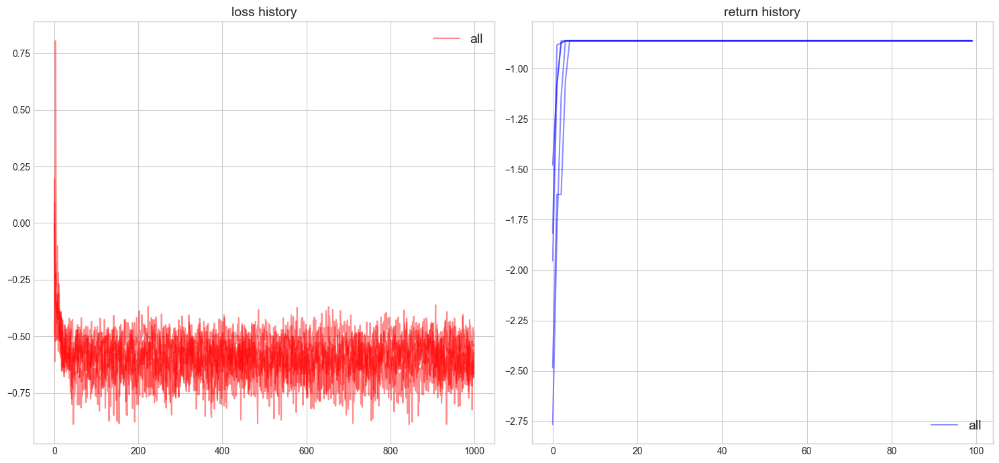

acquired action
action =  [4.644]
action =  [4.194]
action =  [4.489]
action =  [2.51]
action =  [2.758]
action =  [1.576]
action =  [2.033]
action =  [1.644]
action =  [0.905]
action =  [0.436]
total_reward [-0.863]
param distribution in model


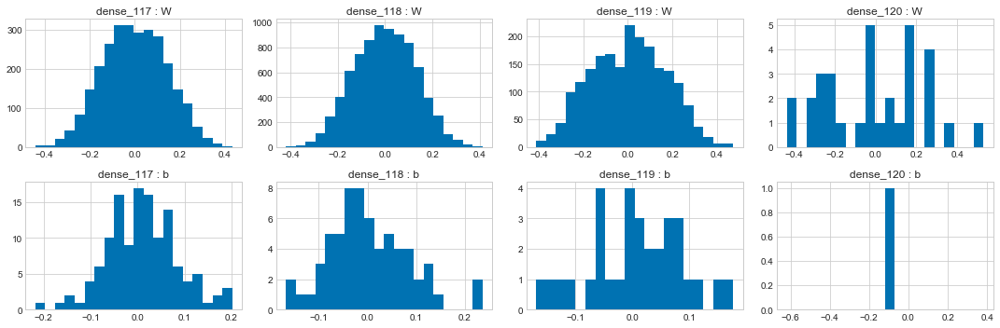

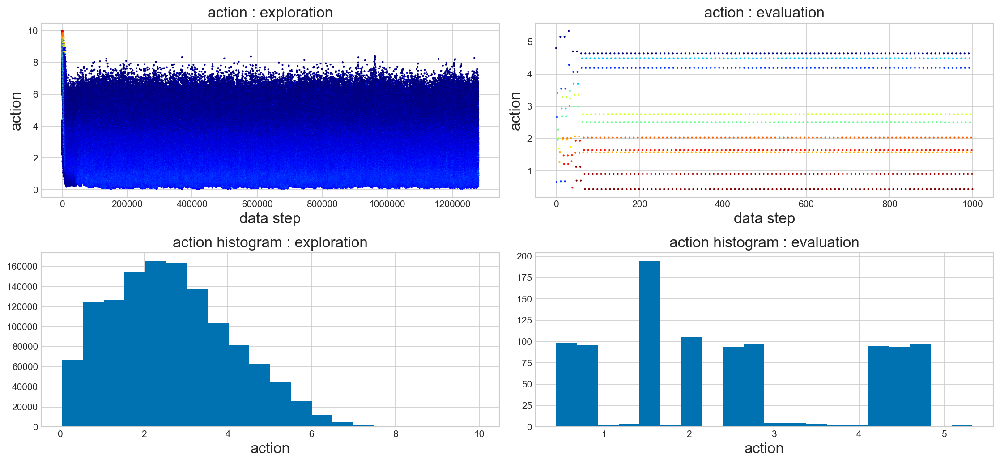

In [14]:
import GA
importlib.reload(GA)
from keras import optimizers

action_min = mu_min
action_max = mu_max

model = GA.gen_model(input_shapes=env.shapes(), n_outputs=1, \
                     hidden_dims=[128, 64, 32], reg_l1=0.0, reg_l2=0.0, \
                     action_min=action_min, action_max=action_max)

#df = pd.DataFrame()
for er, eps in itertools.product([0.5], [1e-2]):
    print('======================================================')
    print('er={}, eps={}'
          .format(er, eps))
    tester = GA.Tester(env, model, name='GA_01')
    #n_trials = 3
    #n_steps = 10000
    tester.test(n_trials=n_trials, n_episodes=n_steps // 10, 
                n_samples=64, ratio_elite=er, 
                gamma=1.0,
                epsilon_start=eps, epsilon_end=eps, epsilon_interval=100,
                verbose=False, verbose_interval=100//10, evaluate_interval=100//10, 
                get_log=True)
    
    viz = GA.Visualizer()
    viz.viz_action_history(tester.trainer, state_valuation=lambda x:x[0], action_valuation=lambda x:x,
                       data_span=1,
                       cmap='jet', alpha=1.0, s=1.0)
    
    for trial in range(n_trials):
        df_temp = pd.DataFrame(np.ravel(tester.return_histories[trial]['all']), columns=['return'])
        df_temp['trial'] = trial
        df_temp['t'] = np.arange(len(df_temp))
        #df_temp['er'] = er
        #df_temp['eps'] = eps
        df_temp['Agent'] = 'GA'

        df = pd.concat([df, df_temp])

    #ModelInspection.inspect_hidden_layers(tester.env, tester.model, tester.agent, show_hidden_hist=True)

df.to_csv(tester.name + '.csv')

---
## 3. Results

In [15]:
pd.options.display.precision = 4
ids = ['Agent',]
df[df['t'].max()*0.9<=df['t']].groupby(ids)['return'].describe()

,count,mean,std,min,25%,50%,75%,max
Agent,,,,,,,,
A2C_continuous,50.0,-0.8880,4.4134e-02,-1.0511,-0.8762,-0.8730,-0.8730,-0.8629
A2C_discrete,50.0,-1.0404,3.3621e-01,-1.7206,-0.8870,-0.8801,-0.8730,-0.8629
AWR,50.0,-2.7620,2.4967e+00,-6.9932,-4.2053,-0.8870,-0.8762,-0.8730
DDPG,50.0,-0.8749,1.6816e-02,-0.9768,-0.8801,-0.8731,-0.8629,-0.8629
DQN,50.0,-0.8689,6.5756e-03,-0.8870,-0.8730,-0.8730,-0.8629,-0.8629
ES,50.0,-0.8694,8.4120e-03,-0.8833,-0.8731,-0.8629,-0.8629,-0.8629
GA,50.0,-0.8629,6.7290e-16,-0.8629,-0.8629,-0.8629,-0.8629,-0.8629
NAF,50.0,-17.7887,1.7769e+01,-52.7832,-11.7021,-9.4099,-9.0335,-5.9439


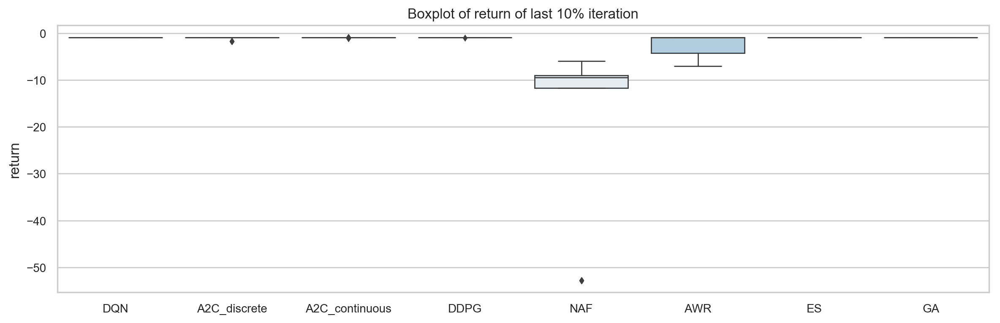

In [16]:
sns.set_style("whitegrid")
sns.set_context("notebook")

plt.figure(figsize=(12, 4), dpi=200)

sns.boxplot(data=df[df['t'].max()*0.9<=df['t']], x='Agent', y='return', orient='v', fliersize=3.0, linewidth=1.0, palette='RdBu')

plt.title('Boxplot of return of last 10% iteration', fontsize=12)
plt.xlabel('', fontsize=12)
plt.ylabel('return', fontsize=12)
plt.tick_params(labelsize=10)

plt.tight_layout()
plt.show()

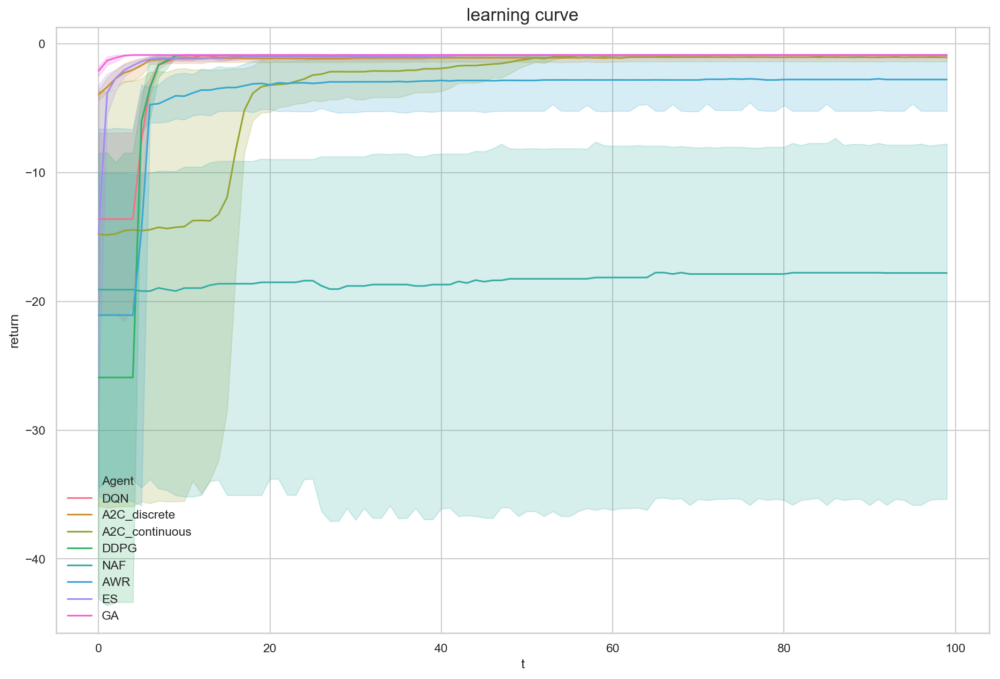

In [17]:
fig = plt.figure(figsize=(15, 10), dpi=150)
sns.lineplot(x='t', y='return', hue='Agent', data=df)
plt.title('learning curve', size=16)
plt.show()